<a href="https://colab.research.google.com/github/manju838/Pytorch-Implementations/blob/main/MNIST_GAN_Implementation.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
import torch
import torch.optim as opt
import torch.nn as nn
import torch.nn.functional as F
import torchvision
import torchvision.transforms as transforms

import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline

In [2]:
mb_size = 64

transform = transforms.ToTensor()

trainData = torchvision.datasets.MNIST('/content/drive/MyDrive/MNIST', download=False, transform=transform, train=True)

trainLoader = torch.utils.data.DataLoader(trainData, shuffle=True, batch_size=mb_size)


Extracting MNIST/raw/train-images-idx3-ubyte.gz to MNIST/raw



Extracting MNIST/raw/train-labels-idx1-ubyte.gz to MNIST/raw



Extracting MNIST/raw/t10k-images-idx3-ubyte.gz to MNIST/raw



Extracting MNIST/raw/t10k-labels-idx1-ubyte.gz to MNIST/raw
Processing...
Done!


/usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:479: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:143.)
  return torch.from_numpy(parsed.astype(m[2], copy=False)).view(*s)


In [3]:
dataIter = iter(trainLoader)

imgs, labels = dataIter.next()

In [4]:
imgs.shape

torch.Size([64, 1, 28, 28])

In [5]:
def imshow(imgs):
    imgs = torchvision.utils.make_grid(imgs)
    npimgs = imgs.numpy()
    plt.figure(figsize=(8,8))
    plt.imshow(np.transpose(npimgs, (1,2,0)), cmap='Greys_r')
    plt.xticks([])
    plt.yticks([])
    plt.show()

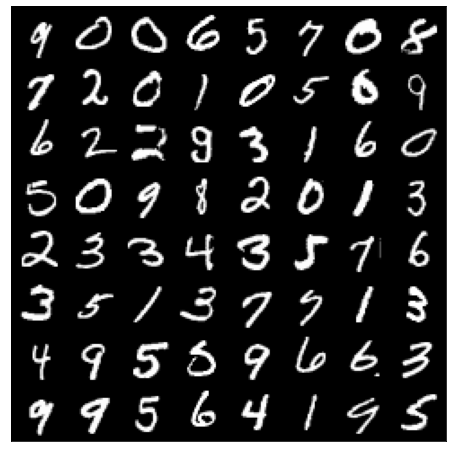

In [6]:
imshow(imgs)

In [7]:
Z_dim = 100
H_dim = 128
X_dim = imgs.view(imgs.size(0), -1).size(1)

print(Z_dim, H_dim, X_dim)

device = 'cuda'

100 128 784


In [8]:
class Gen(nn.Module):
    def __init__(self):
        super().__init__()
        self.model = nn.Sequential(
            nn.Linear(Z_dim, H_dim),
            nn.ReLU(),
            nn.Linear(H_dim, X_dim),
            nn.Sigmoid()
        )
          
    def forward(self, input):
        return self.model(input)

In [9]:
G = Gen().to(device)

In [10]:
class Dis(nn.Module):
    def __init__(self):
        super().__init__()
        self.model = nn.Sequential(
            nn.Linear(X_dim, H_dim),
            nn.ReLU(),
            nn.Linear(H_dim, 1),
            nn.Sigmoid()
        )
        
    def forward(self, input):
        return self.model(input)

In [11]:
D = Dis().to(device)

In [12]:
print(G)
print(D)

Gen(
  (model): Sequential(
    (0): Linear(in_features=100, out_features=128, bias=True)
    (1): ReLU()
    (2): Linear(in_features=128, out_features=784, bias=True)
    (3): Sigmoid()
  )
)
Dis(
  (model): Sequential(
    (0): Linear(in_features=784, out_features=128, bias=True)
    (1): ReLU()
    (2): Linear(in_features=128, out_features=1, bias=True)
    (3): Sigmoid()
  )
)


In [13]:
lr = 1e-3

g_opt = opt.Adam(G.parameters(), lr=lr)
d_opt = opt.Adam(D.parameters(), lr=lr)

Epoch:0,   G_loss:1.8154281295184642,    D_loss:0.809256931421345


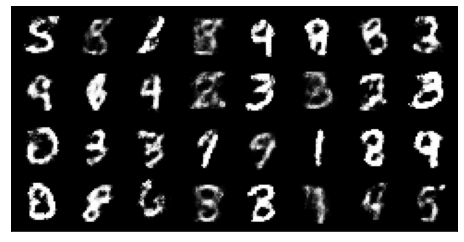

Epoch:1,   G_loss:1.8364760082667824,    D_loss:0.8040074219962935


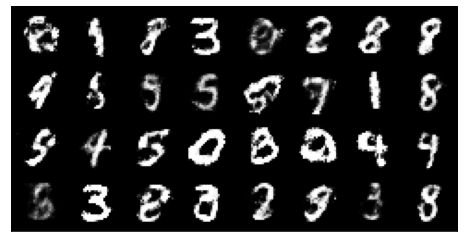

Epoch:2,   G_loss:1.8184480013877853,    D_loss:0.8125146666823674


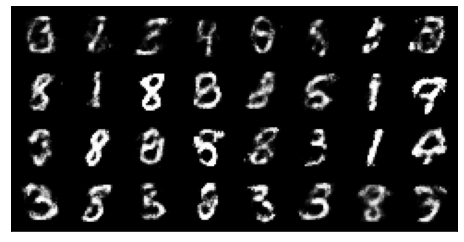

Epoch:3,   G_loss:1.8322980003570444,    D_loss:0.8014392939839028


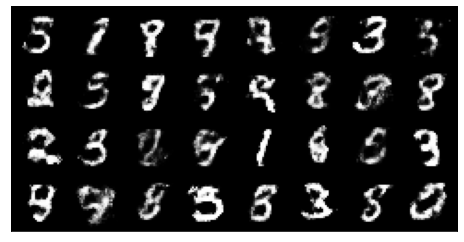

Epoch:4,   G_loss:1.835352780595263,    D_loss:0.7981189730197891


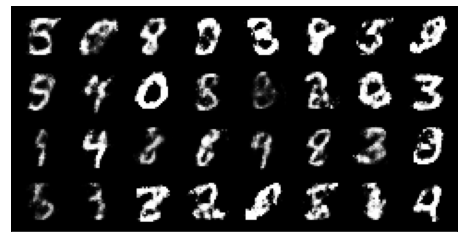

Epoch:5,   G_loss:1.837381236588777,    D_loss:0.7958403510897398


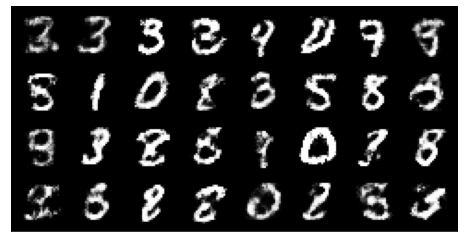

Epoch:6,   G_loss:1.86143761898663,    D_loss:0.7986377063971847


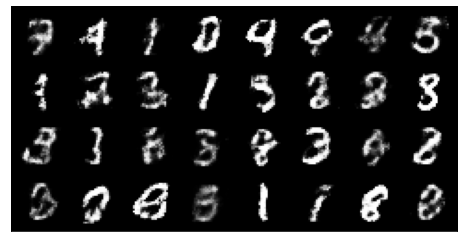

Epoch:7,   G_loss:1.861216460463843,    D_loss:0.7913047827001828


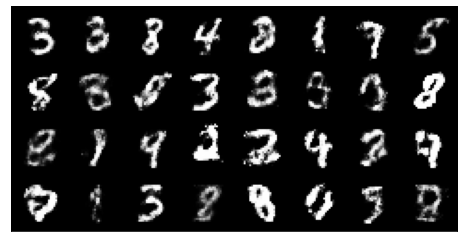

Epoch:8,   G_loss:1.858639886638503,    D_loss:0.783661002352802


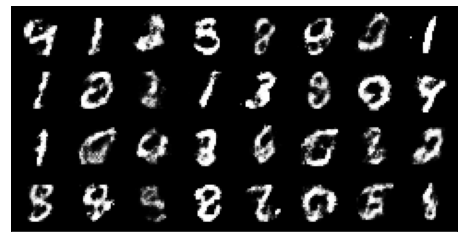

Epoch:9,   G_loss:1.871344564947238,    D_loss:0.7830482633637467


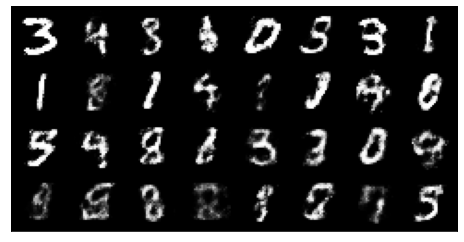

Epoch:10,   G_loss:1.8798106516093842,    D_loss:0.7822781781524991


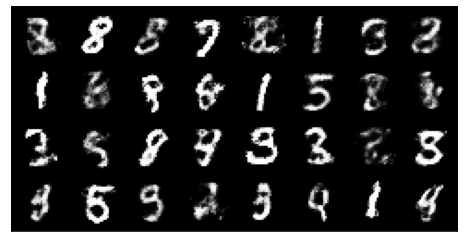

Epoch:11,   G_loss:1.883118645214577,    D_loss:0.7762957759249185


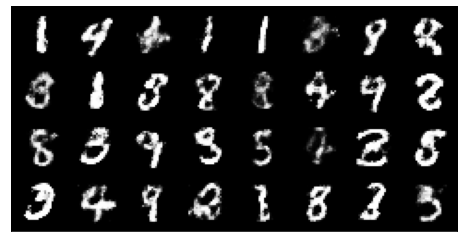

Epoch:12,   G_loss:1.8921426669366832,    D_loss:0.7724250885787041


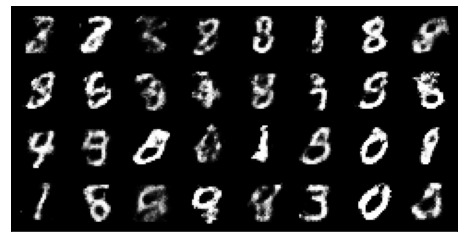

Epoch:13,   G_loss:1.9027848731734351,    D_loss:0.7681423455858027


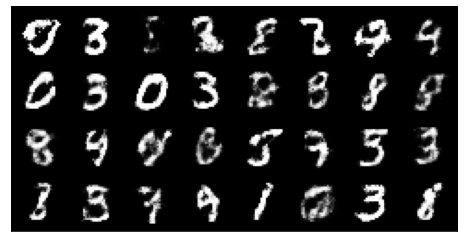

Epoch:14,   G_loss:1.9132291912269999,    D_loss:0.7637637380216675


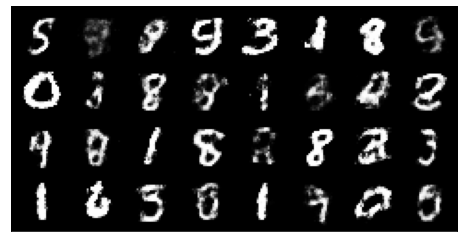

Epoch:15,   G_loss:1.9166755879611603,    D_loss:0.7636303274489161


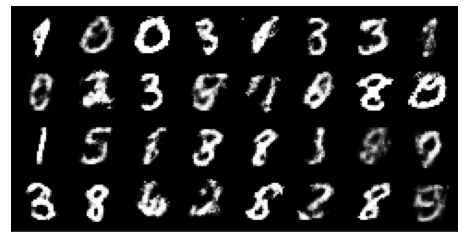

Epoch:16,   G_loss:1.9226035976460747,    D_loss:0.761570045466362


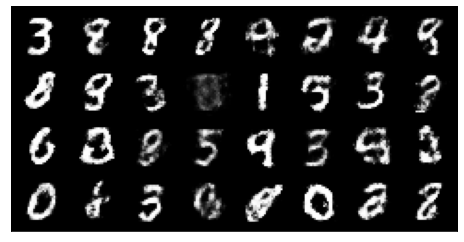

Epoch:17,   G_loss:1.9304299508330665,    D_loss:0.754514515590566


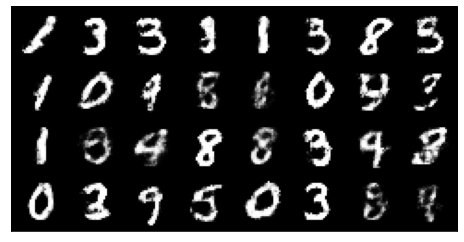

Epoch:18,   G_loss:1.9407122077972396,    D_loss:0.7546952523148136


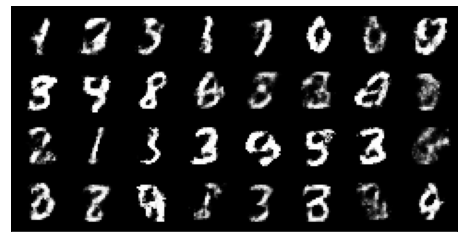

Epoch:19,   G_loss:1.9336782599817206,    D_loss:0.7497775897796728


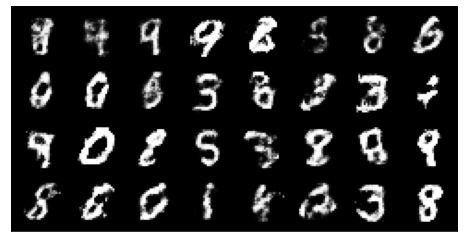

Epoch:20,   G_loss:1.9611601565184116,    D_loss:0.7467579727233854


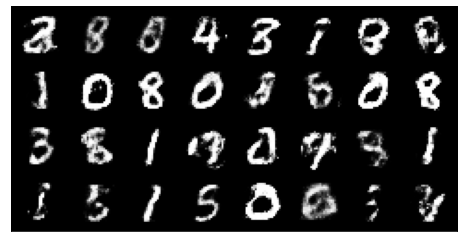

Epoch:21,   G_loss:1.9652345170344372,    D_loss:0.7453590987969055


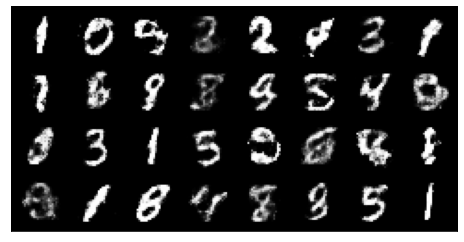

Epoch:22,   G_loss:1.955033564872579,    D_loss:0.7378925404696068


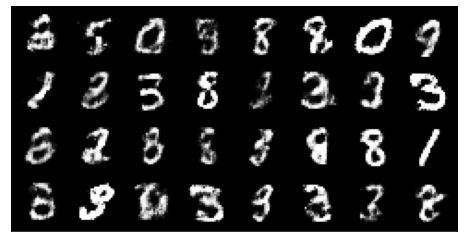

Epoch:23,   G_loss:1.9709183352588335,    D_loss:0.735213875484619


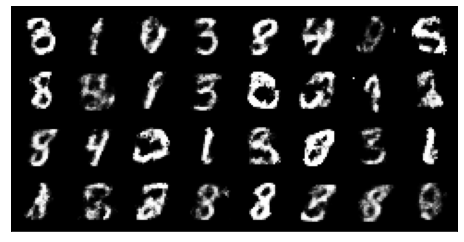

Epoch:24,   G_loss:1.9821117067896228,    D_loss:0.7366888175196231


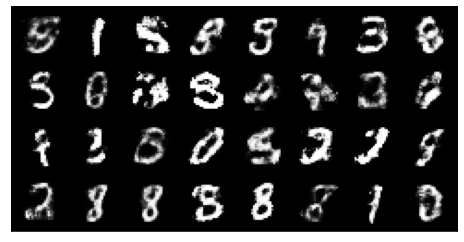

Epoch:25,   G_loss:1.9824681771335317,    D_loss:0.7257360751504329


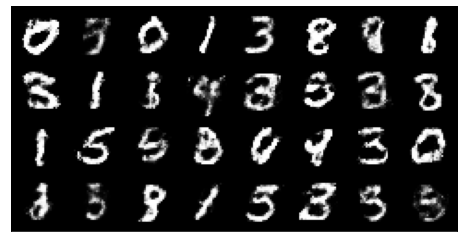

Epoch:26,   G_loss:2.004706730847674,    D_loss:0.7234592978506963


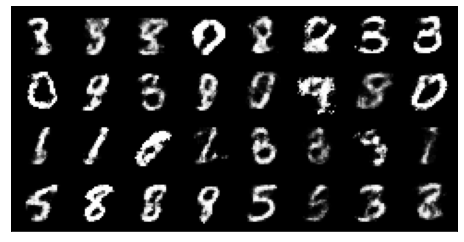

Epoch:27,   G_loss:2.0076408859000785,    D_loss:0.7169936059126213


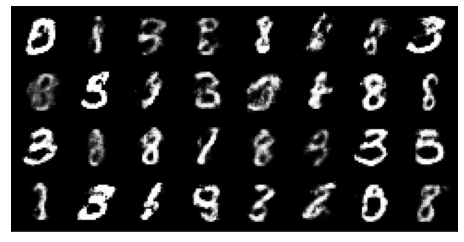

Epoch:28,   G_loss:2.0207981557480053,    D_loss:0.7212241504555826


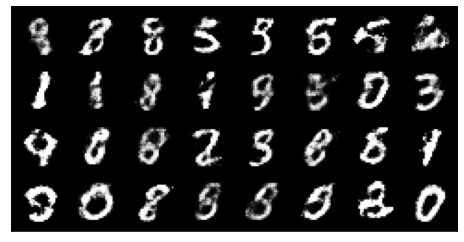

Epoch:29,   G_loss:2.031099560926718,    D_loss:0.7158938399446544


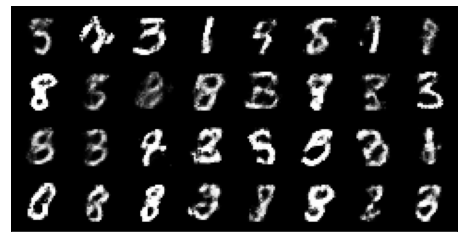

Epoch:30,   G_loss:2.0299473517993367,    D_loss:0.715340266127322


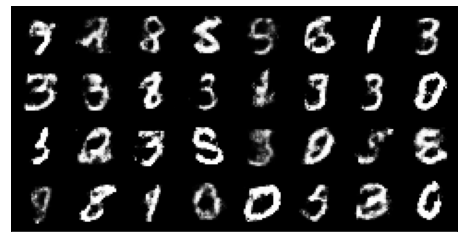

Epoch:31,   G_loss:2.030615392778474,    D_loss:0.7065858409475925


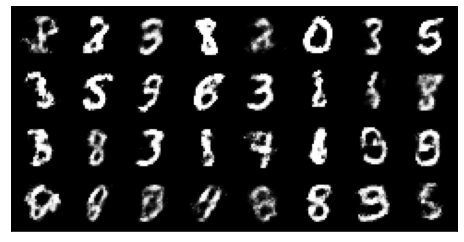

Epoch:32,   G_loss:2.0402149240345335,    D_loss:0.7077850749942539


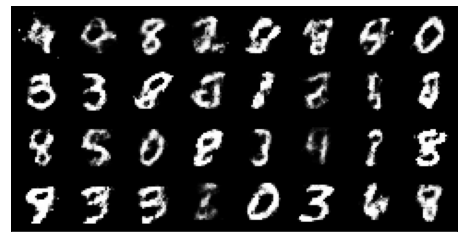

Epoch:33,   G_loss:2.0391062593409246,    D_loss:0.7064128732249173


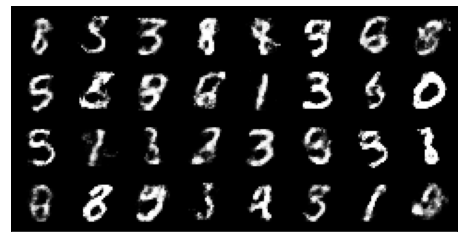

Epoch:34,   G_loss:2.0458902730616426,    D_loss:0.7042302536621277


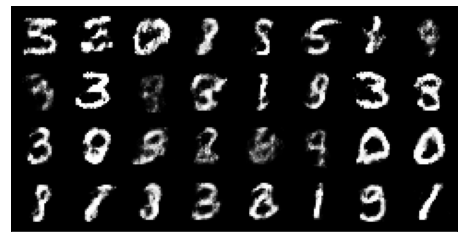

Epoch:35,   G_loss:2.0600878287480078,    D_loss:0.6993046368934961


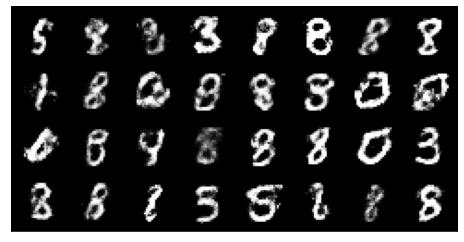

Epoch:36,   G_loss:2.0753851940891126,    D_loss:0.6981373024202867


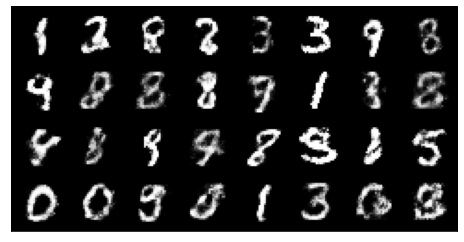

Epoch:37,   G_loss:2.087694490896359,    D_loss:0.6972400151780928


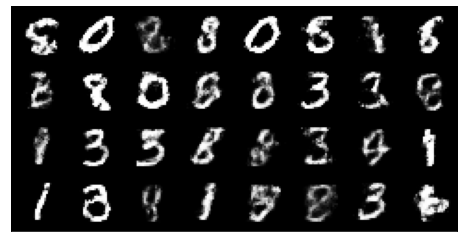

Epoch:38,   G_loss:2.08079013959177,    D_loss:0.690860601567002


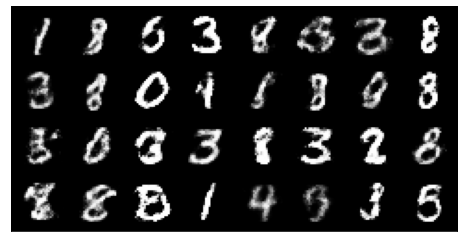

Epoch:39,   G_loss:2.0899945939781825,    D_loss:0.6879957164528527


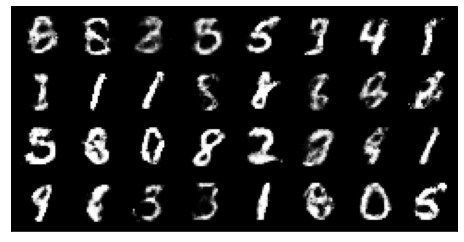

Epoch:40,   G_loss:2.099010125406261,    D_loss:0.6864212063520447


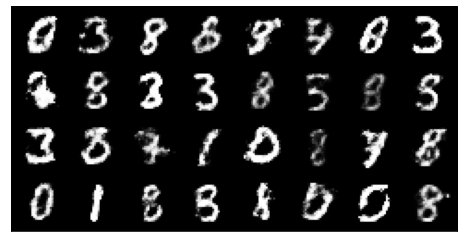

Epoch:41,   G_loss:2.115360822123505,    D_loss:0.6846709573256181


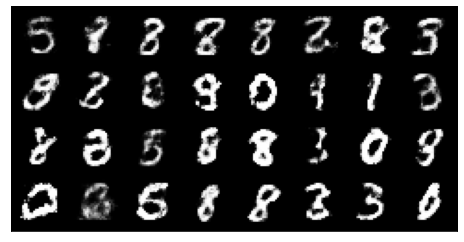

Epoch:42,   G_loss:2.1159740352173095,    D_loss:0.6811205627186212


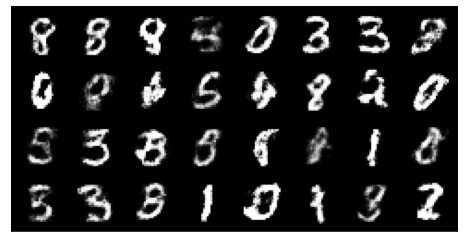

Epoch:43,   G_loss:2.133184810437119,    D_loss:0.6807677870366111


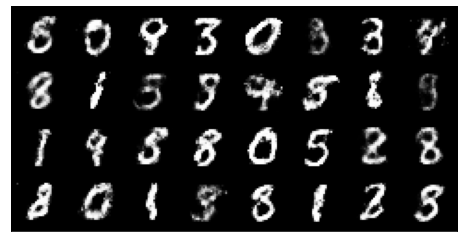

Epoch:44,   G_loss:2.141680395933611,    D_loss:0.6709449591794248


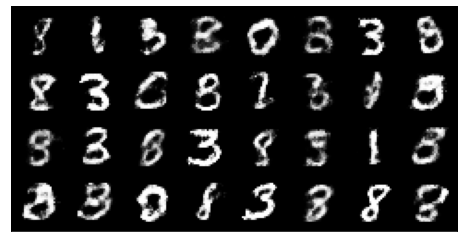

Epoch:45,   G_loss:2.154959046637326,    D_loss:0.6723572630872096


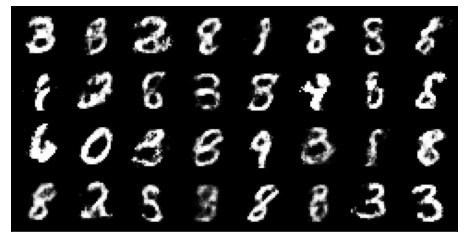

Epoch:46,   G_loss:2.1558738486853235,    D_loss:0.6716235853525113


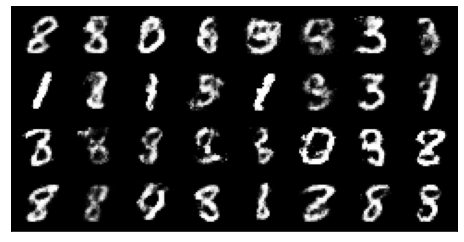

Epoch:47,   G_loss:2.1393674521812245,    D_loss:0.6725727815999151


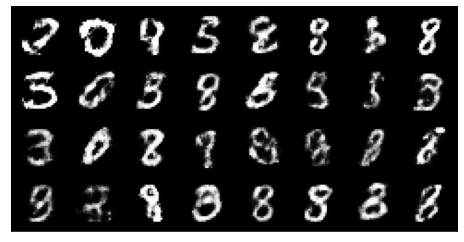

Epoch:48,   G_loss:2.1558300090242803,    D_loss:0.6726775229739737


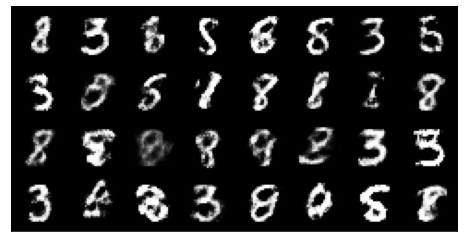

Epoch:49,   G_loss:2.16215323715576,    D_loss:0.6644750762023905


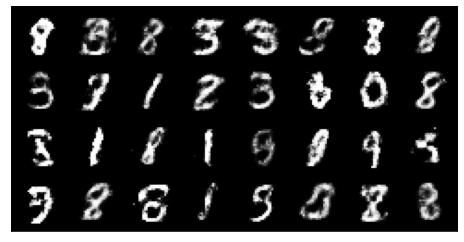

Epoch:50,   G_loss:2.1482956342097284,    D_loss:0.6673770407433195


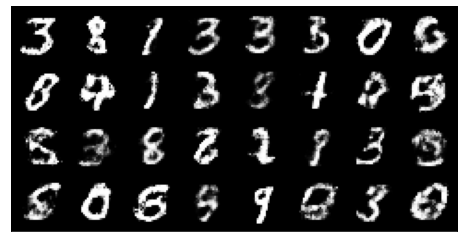

Epoch:51,   G_loss:2.1579154962415634,    D_loss:0.6646585218560721


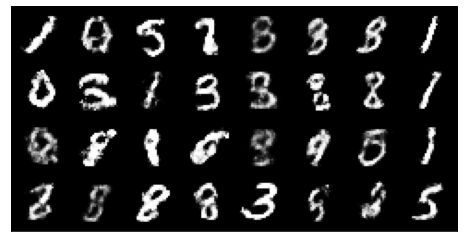

Epoch:52,   G_loss:2.1719997274850225,    D_loss:0.6634266442899257


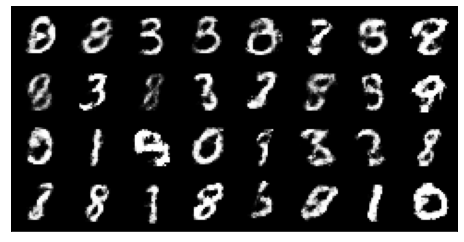

Epoch:53,   G_loss:2.1821528228361213,    D_loss:0.6588609651334758


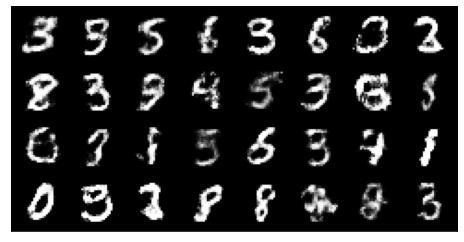

Epoch:54,   G_loss:2.183793100848127,    D_loss:0.6548665413406612


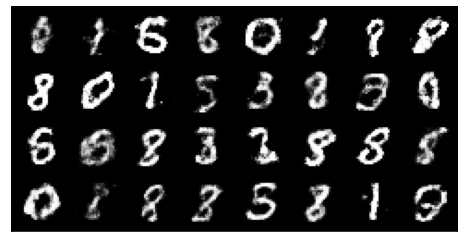

Epoch:55,   G_loss:2.2087465675909126,    D_loss:0.6485244794758652


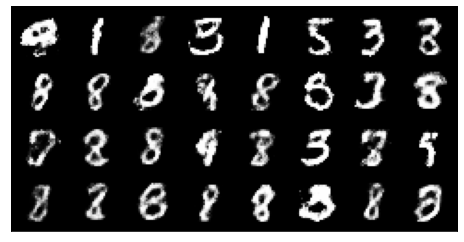

Epoch:56,   G_loss:2.2114102695542357,    D_loss:0.6461929357064559


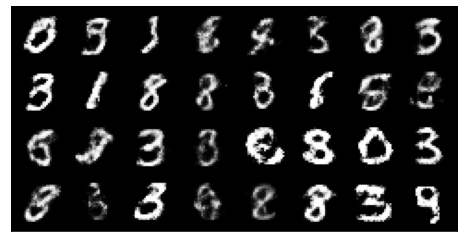

Epoch:57,   G_loss:2.207274061403295,    D_loss:0.6424124615151745


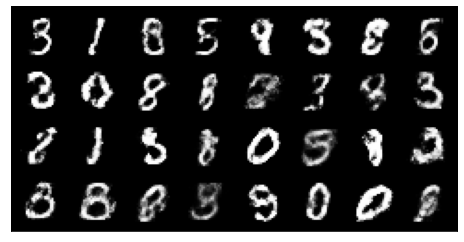

Epoch:58,   G_loss:2.2187695490525985,    D_loss:0.6377109329202282


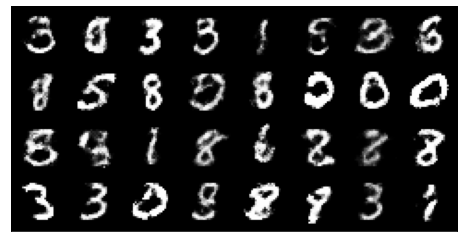

Epoch:59,   G_loss:2.2355064730654393,    D_loss:0.6422498623318256


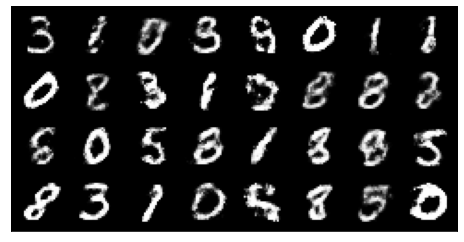

Epoch:60,   G_loss:2.2108947778307297,    D_loss:0.6467862089496177


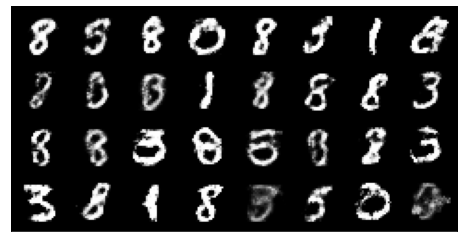

Epoch:61,   G_loss:2.210690126998592,    D_loss:0.642405459176757


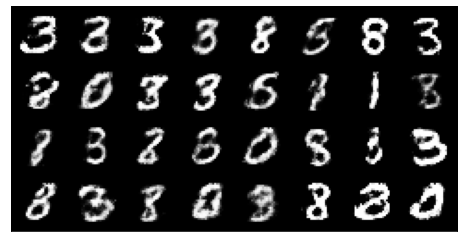

Epoch:62,   G_loss:2.227135805814251,    D_loss:0.6390933335971222


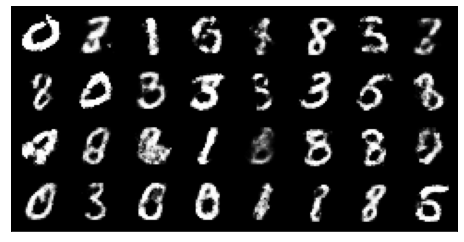

Epoch:63,   G_loss:2.252932621726095,    D_loss:0.6338726223341183


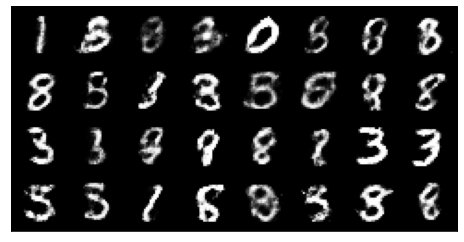

Epoch:64,   G_loss:2.237148894557058,    D_loss:0.641176739926023


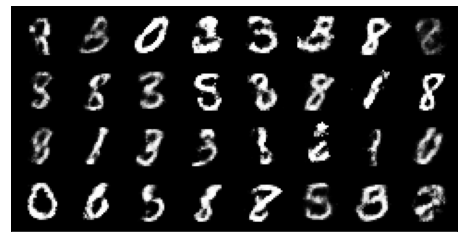

Epoch:65,   G_loss:2.234677508949979,    D_loss:0.6388982035267328


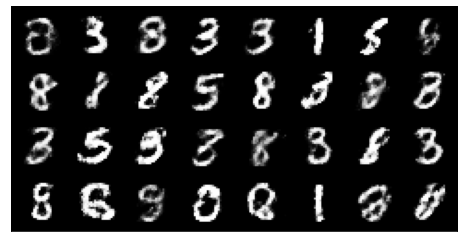

Epoch:66,   G_loss:2.2388826913670945,    D_loss:0.6347651333569972


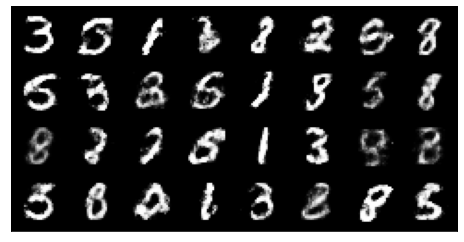

Epoch:67,   G_loss:2.2454980990525755,    D_loss:0.635731848731224


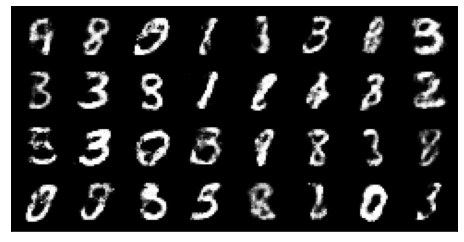

Epoch:68,   G_loss:2.23862610773237,    D_loss:0.6357822168165687


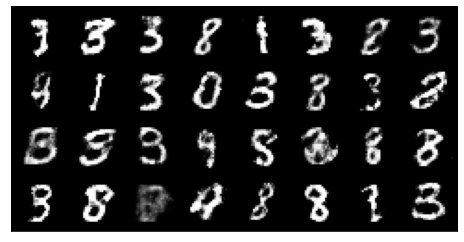

Epoch:69,   G_loss:2.266263224041538,    D_loss:0.6300274166725338


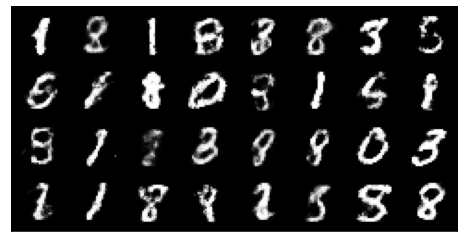

Epoch:70,   G_loss:2.2600535834267705,    D_loss:0.6303545188929226


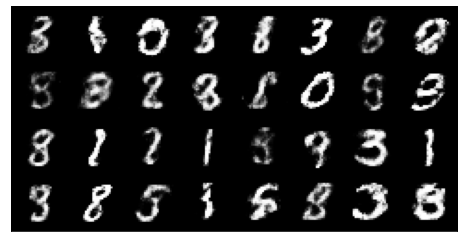

Epoch:71,   G_loss:2.263527723263576,    D_loss:0.6285878177771944


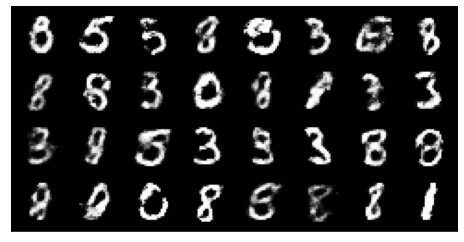

Epoch:72,   G_loss:2.2866111523561132,    D_loss:0.6285150638584898


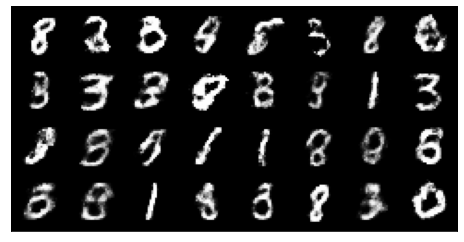

Epoch:73,   G_loss:2.2659660651485547,    D_loss:0.6283672072930631


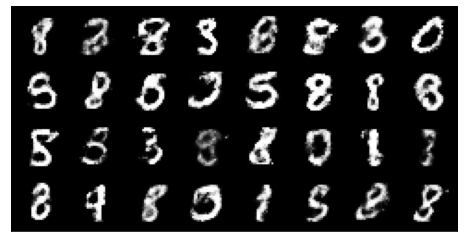

Epoch:74,   G_loss:2.272400411461462,    D_loss:0.6284968939099485


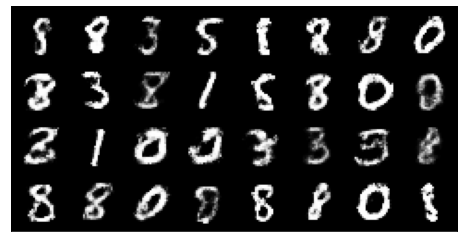

Epoch:75,   G_loss:2.2756269070893715,    D_loss:0.6287409106233736


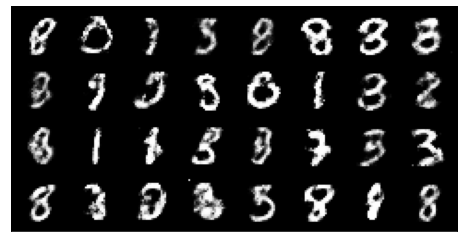

Epoch:76,   G_loss:2.258900376525261,    D_loss:0.6463762617378093


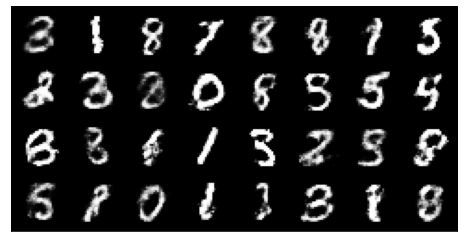

Epoch:77,   G_loss:2.2717385796595737,    D_loss:0.6306200850365767


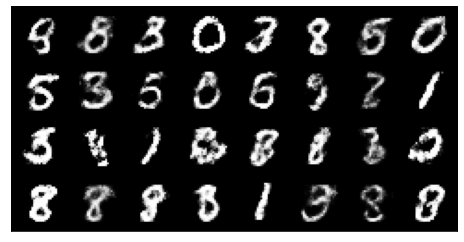

Epoch:78,   G_loss:2.293493058762825,    D_loss:0.6245708328955717


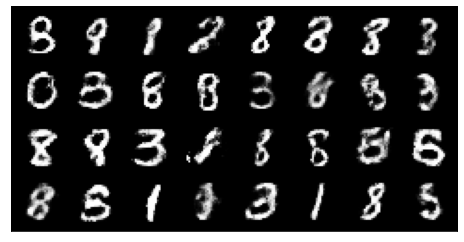

Epoch:79,   G_loss:2.2768414474245326,    D_loss:0.6173618438719178


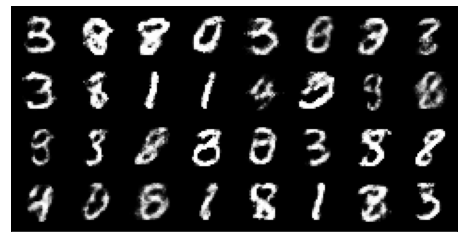

Epoch:80,   G_loss:2.2689028332736703,    D_loss:0.6149639431347471


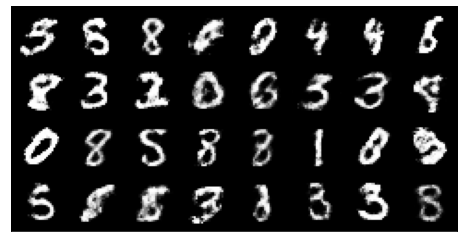

Epoch:81,   G_loss:2.274740977200872,    D_loss:0.6170428691388193


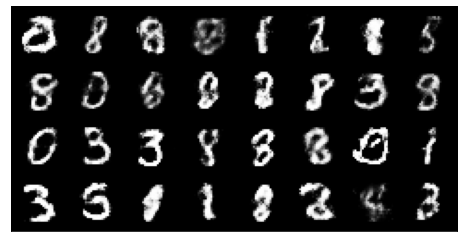

Epoch:82,   G_loss:2.2798268426455923,    D_loss:0.6150866342124655


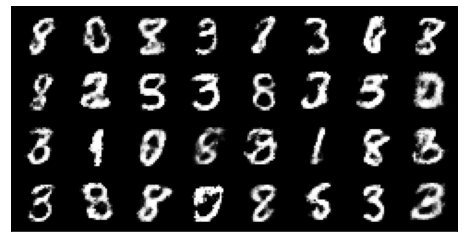

Epoch:83,   G_loss:2.304967728123736,    D_loss:0.6187789301310521


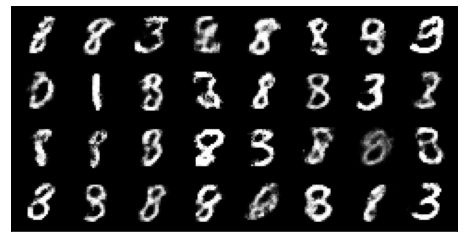

Epoch:84,   G_loss:2.2951657899153,    D_loss:0.6165207074458665


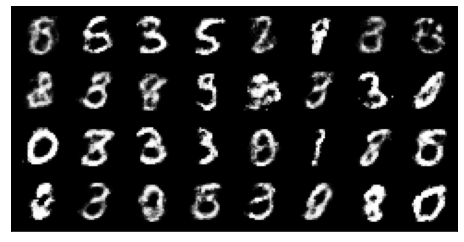

Epoch:85,   G_loss:2.287689728650457,    D_loss:0.6143471084551008


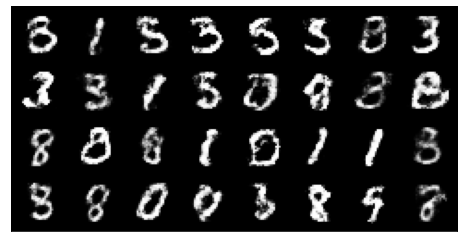

Epoch:86,   G_loss:2.3047506538535485,    D_loss:0.6117611826737044


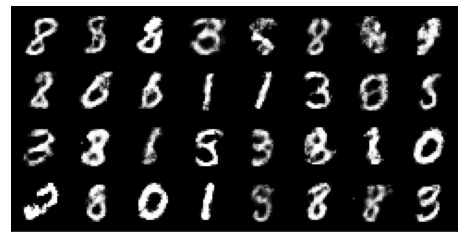

Epoch:87,   G_loss:2.312385973137325,    D_loss:0.6126081519988554


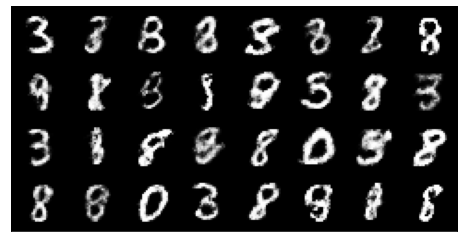

Epoch:88,   G_loss:2.318161156767213,    D_loss:0.6116201896339591


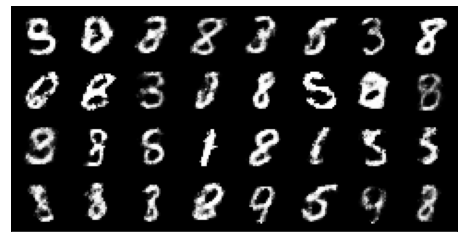

Epoch:89,   G_loss:2.320411103239446,    D_loss:0.6152297977699654


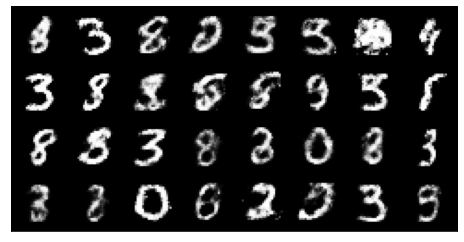

Epoch:90,   G_loss:2.305669802084152,    D_loss:0.6152424766247206


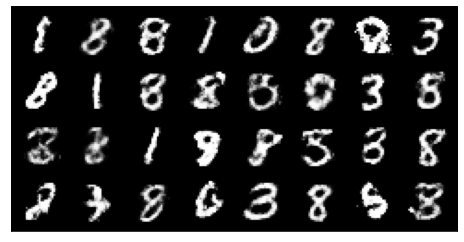

Epoch:91,   G_loss:2.3121087073263076,    D_loss:0.6043770248765377


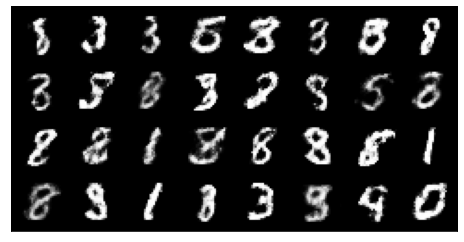

Epoch:92,   G_loss:2.3164634939704114,    D_loss:0.6043020774687785


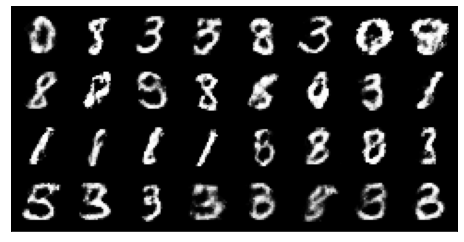

Epoch:93,   G_loss:2.322229303912059,    D_loss:0.6059734220189581


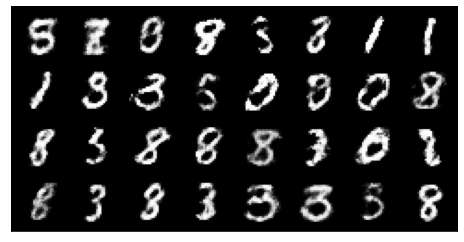

Epoch:94,   G_loss:2.32576331731353,    D_loss:0.6029643284550099


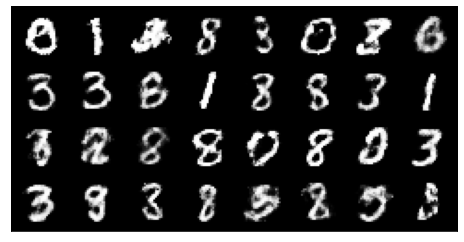

Epoch:95,   G_loss:2.338198339125749,    D_loss:0.6084700955320269


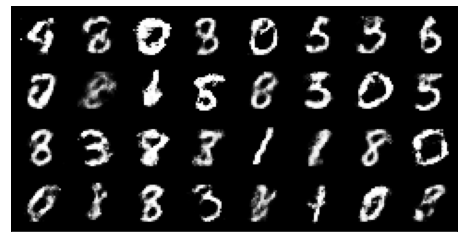

Epoch:96,   G_loss:2.3194633421104855,    D_loss:0.6037696002325269


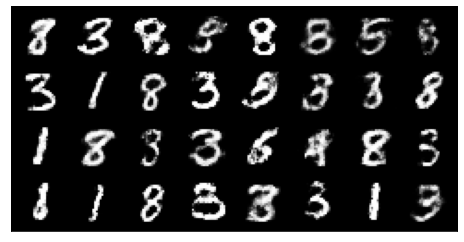

Epoch:97,   G_loss:2.328720481538061,    D_loss:0.608978826640003


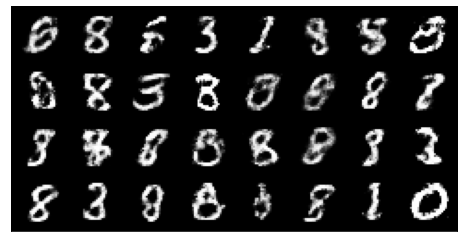

Epoch:98,   G_loss:2.330535175703736,    D_loss:0.6086010535769879


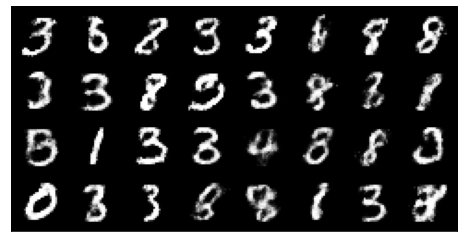

Epoch:99,   G_loss:2.3338880466499816,    D_loss:0.6097134125830014


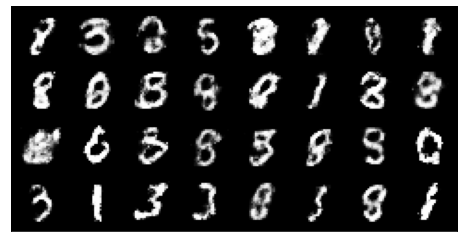

Epoch:100,   G_loss:2.3470578493594108,    D_loss:0.6054271490716222


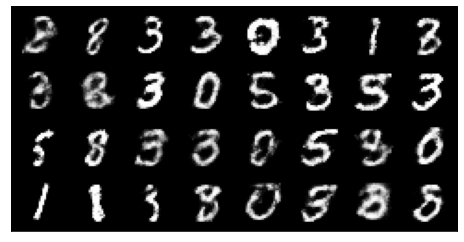

Epoch:101,   G_loss:2.3470501798048202,    D_loss:0.6019127209430565


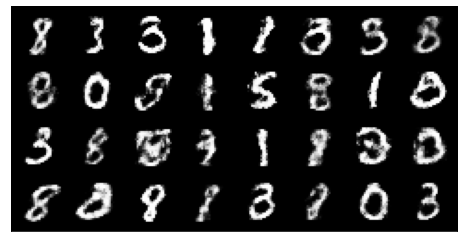

Epoch:102,   G_loss:2.330190125431842,    D_loss:0.6047771113640719


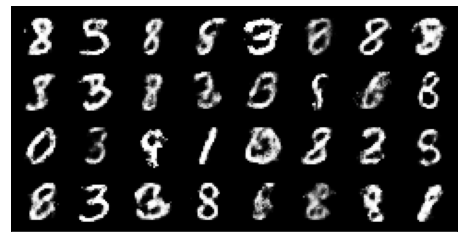

Epoch:103,   G_loss:2.3440070735620284,    D_loss:0.5973585134884442


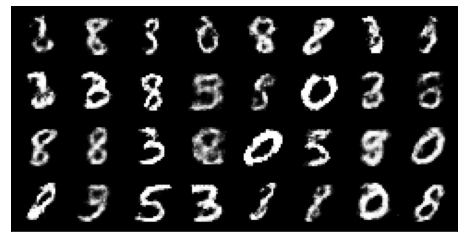

Epoch:104,   G_loss:2.3534845094690953,    D_loss:0.5989026936895049


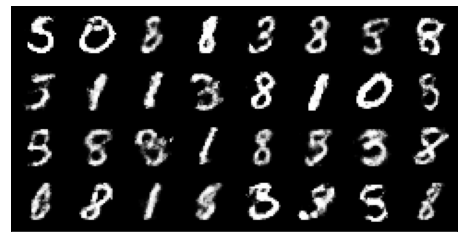

Epoch:105,   G_loss:2.3350413242128614,    D_loss:0.6025670137740909


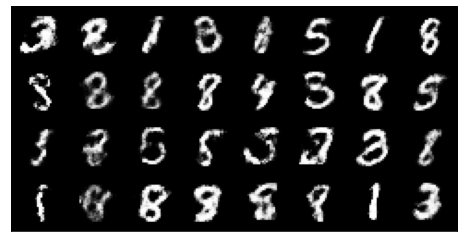

Epoch:106,   G_loss:2.3461306186627224,    D_loss:0.6038281428597884


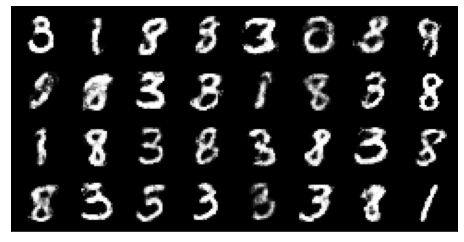

Epoch:107,   G_loss:2.343553739061742,    D_loss:0.6001721256768017


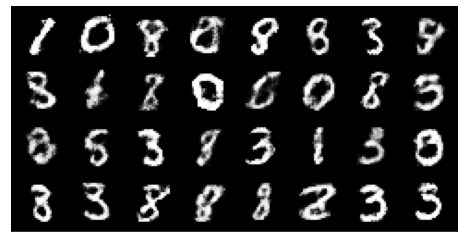

Epoch:108,   G_loss:2.3442763517152017,    D_loss:0.5966508042202321


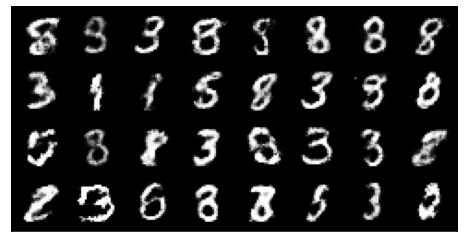

Epoch:109,   G_loss:2.355329970561111,    D_loss:0.5927341491428774


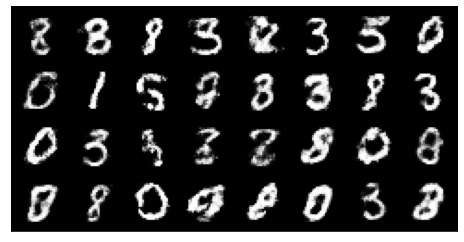

Epoch:110,   G_loss:2.3811456113736003,    D_loss:0.5929883729928592


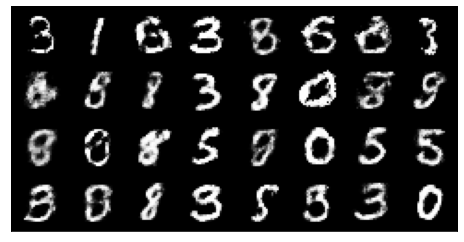

Epoch:111,   G_loss:2.378983038701991,    D_loss:0.5931643347051352


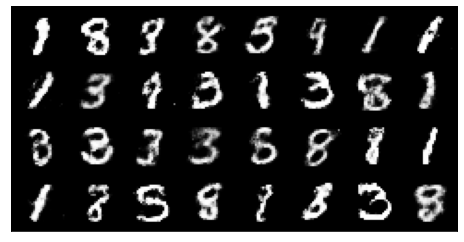

Epoch:112,   G_loss:2.3656999904717972,    D_loss:0.5885231733830498


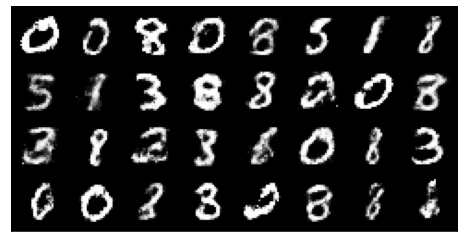

Epoch:113,   G_loss:2.3686330010896044,    D_loss:0.5942943544148891


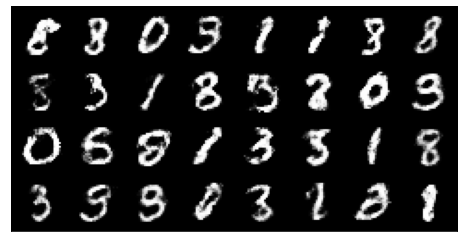

Epoch:114,   G_loss:2.3738416573132026,    D_loss:0.5945075094890493


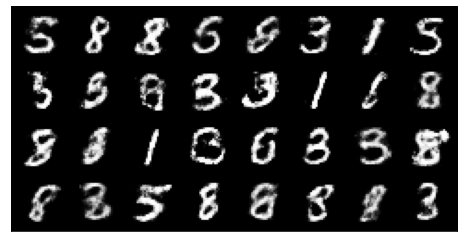

Epoch:115,   G_loss:2.3734778894036057,    D_loss:0.5924399105915382


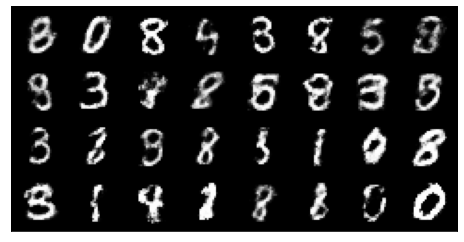

Epoch:116,   G_loss:2.3614741931083616,    D_loss:0.5926433681869812


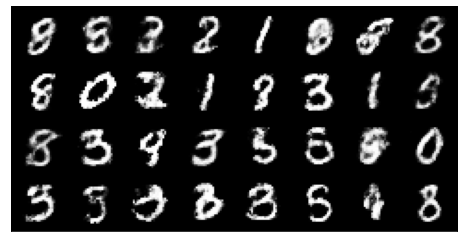

Epoch:117,   G_loss:2.3747733584853377,    D_loss:0.5890510420936511


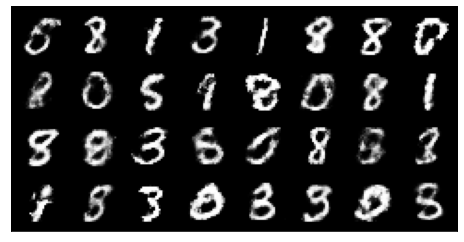

Epoch:118,   G_loss:2.3707410329694687,    D_loss:0.5934532688879001


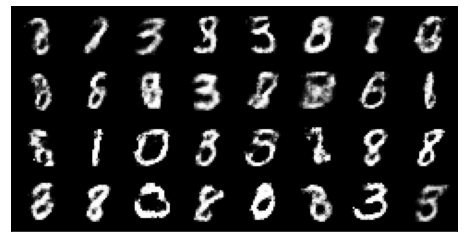

Epoch:119,   G_loss:2.354322542259688,    D_loss:0.5902939157000483


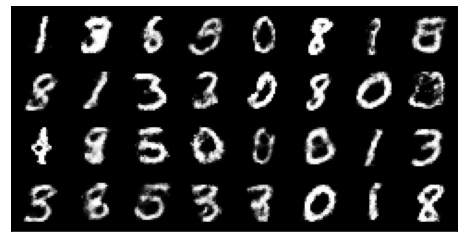

Epoch:120,   G_loss:2.3895571488561407,    D_loss:0.5884569523685268


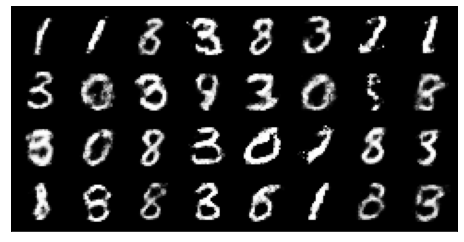

Epoch:121,   G_loss:2.3823065986511294,    D_loss:0.5874929488467764


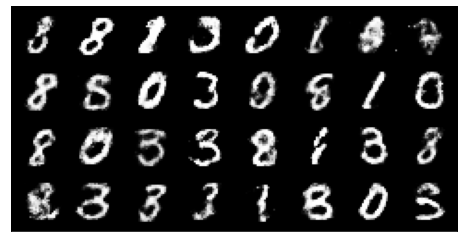

Epoch:122,   G_loss:2.3850883001457652,    D_loss:0.589512481078156


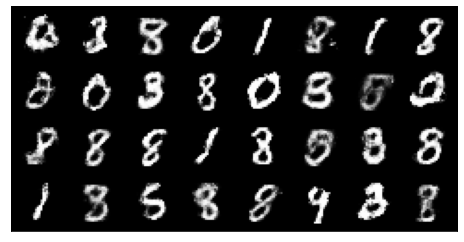

Epoch:123,   G_loss:2.3913950519775278,    D_loss:0.5912462886271954


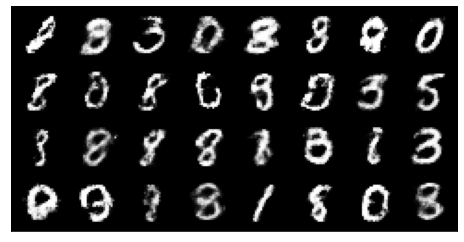

Epoch:124,   G_loss:2.3820189504481073,    D_loss:0.5850468710350838


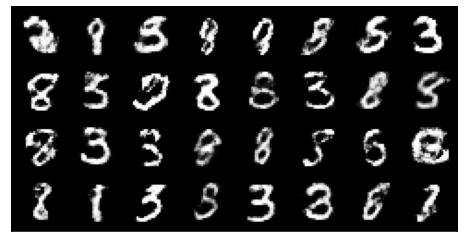

Epoch:125,   G_loss:2.3868634126333794,    D_loss:0.5888659170886347


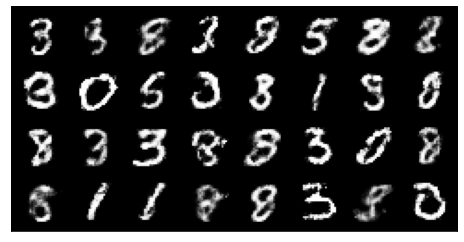

Epoch:126,   G_loss:2.3984970360168263,    D_loss:0.5845601920888368


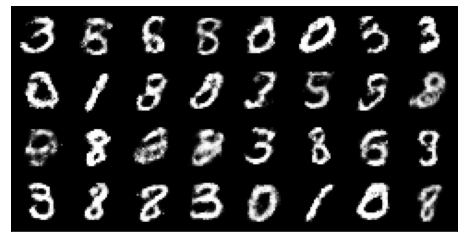

Epoch:127,   G_loss:2.3971003953581933,    D_loss:0.579838489227966


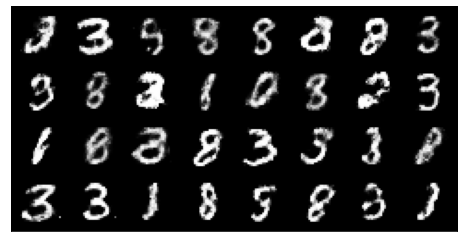

Epoch:128,   G_loss:2.398811208540951,    D_loss:0.5818551825498467


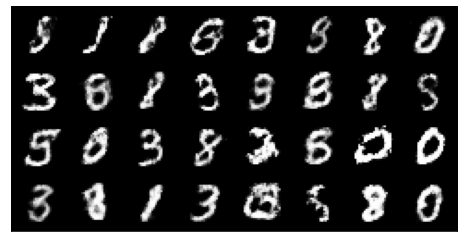

Epoch:129,   G_loss:2.409070299378336,    D_loss:0.5762044252363095


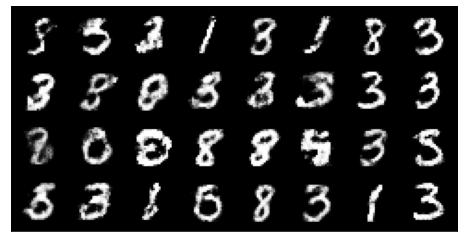

Epoch:130,   G_loss:2.40281364340772,    D_loss:0.5810580149705984


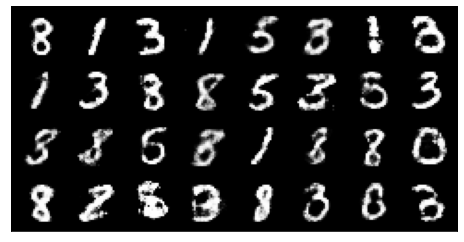

Epoch:131,   G_loss:2.4020113660328426,    D_loss:0.5831987438743302


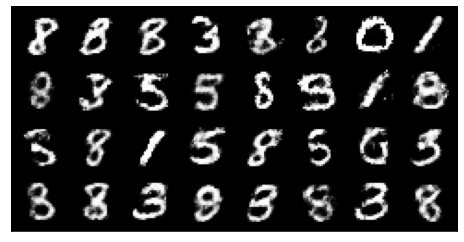

Epoch:132,   G_loss:2.4165907794478607,    D_loss:0.5768218136736071


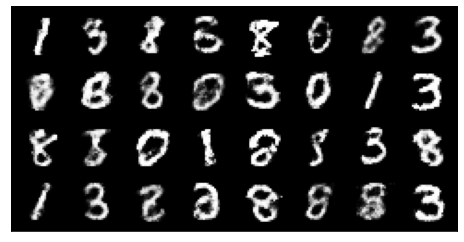

Epoch:133,   G_loss:2.403322006466546,    D_loss:0.5714165233472771


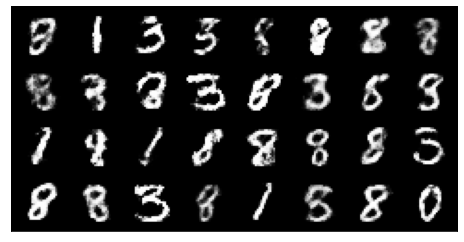

Epoch:134,   G_loss:2.4154147714185816,    D_loss:0.5754143965206167


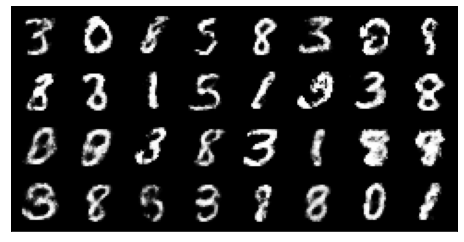

Epoch:135,   G_loss:2.4144399496538043,    D_loss:0.5741968199388304


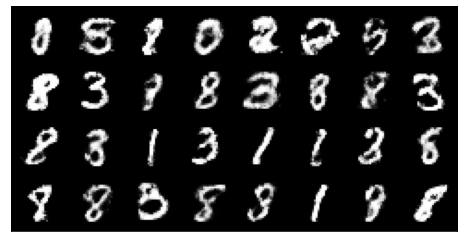

Epoch:136,   G_loss:2.4023990723878335,    D_loss:0.5709363023228229


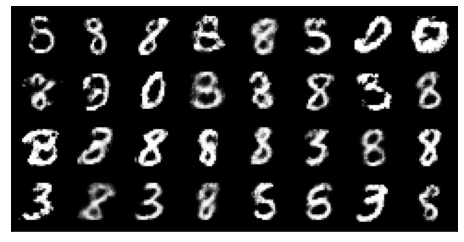

Epoch:137,   G_loss:2.4216192847630107,    D_loss:0.5724782241559995


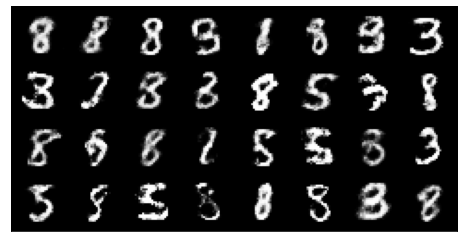

Epoch:138,   G_loss:2.4088954685339288,    D_loss:0.571952465532431


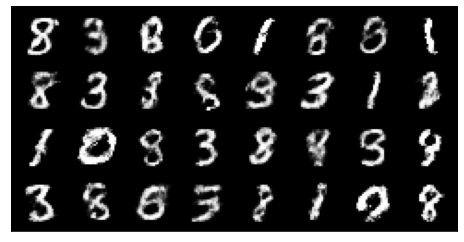

Epoch:139,   G_loss:2.4230255428661924,    D_loss:0.5710442005507728


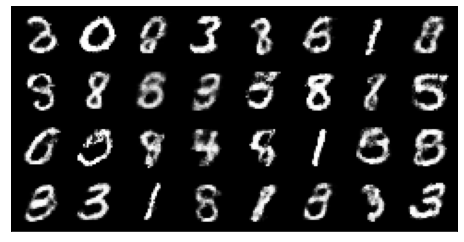

Epoch:140,   G_loss:2.4112583593264825,    D_loss:0.5681537778964684


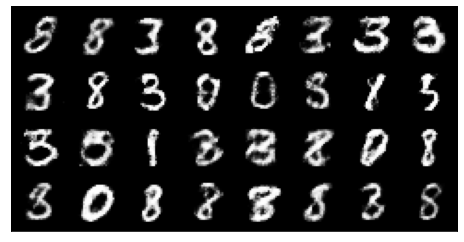

Epoch:141,   G_loss:2.4213748303557763,    D_loss:0.5740955398598714


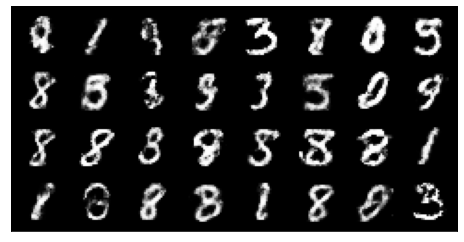

Epoch:142,   G_loss:2.437138815551424,    D_loss:0.5715117358259046


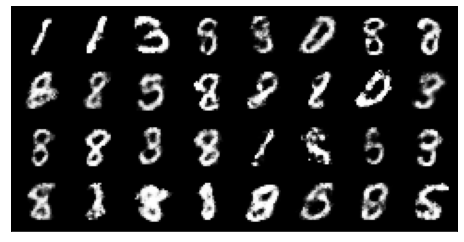

Epoch:143,   G_loss:2.440663891179221,    D_loss:0.566221961143937


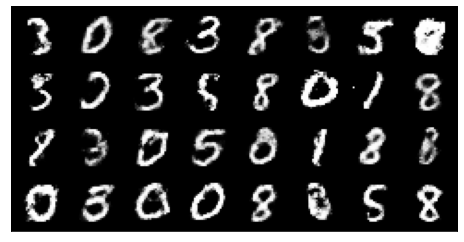

Epoch:144,   G_loss:2.4638661210979227,    D_loss:0.5662690815386742


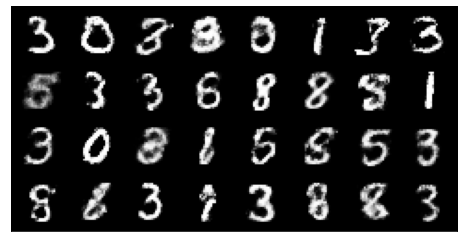

Epoch:145,   G_loss:2.4426128236469684,    D_loss:0.5676112004371086


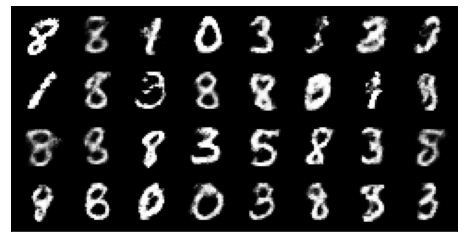

Epoch:146,   G_loss:2.4401580036830293,    D_loss:0.5638602023312786


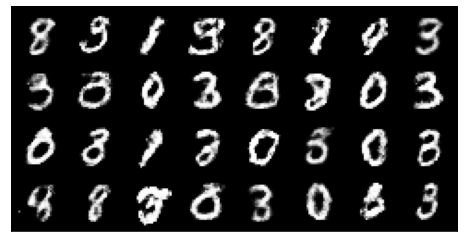

Epoch:147,   G_loss:2.4573755912435082,    D_loss:0.5664780223166256


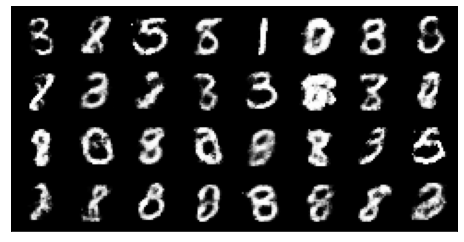

Epoch:148,   G_loss:2.4700480446632485,    D_loss:0.5606406819718733


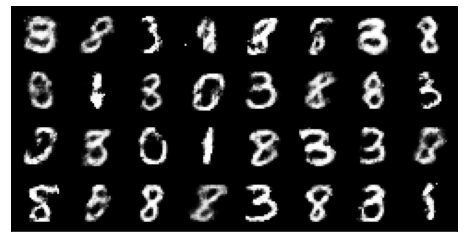

Epoch:149,   G_loss:2.457386523040373,    D_loss:0.5633251107514285


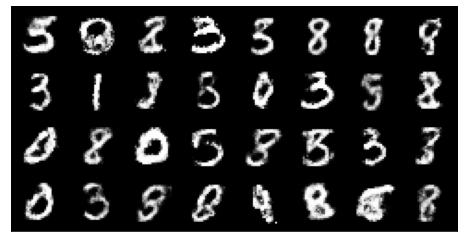

In [17]:


for epoch in range(150):
    G_loss_run = 0.0
    D_loss_run = 0.0
    for i, data in enumerate(trainLoader):
        X, _ = data
        X = X.view(X.size(0), -1).to(device)
        mb_size = X.size(0)
        
        one_labels = torch.ones(mb_size, 1).to(device)
        zero_labels = torch.zeros(mb_size, 1).to(device)
        
        z = torch.randn(mb_size, Z_dim).to(device)
        
        D_real = D(X)
        D_fake = D(G(z))
        
        D_real_loss = F.binary_cross_entropy(D_real, one_labels)
        D_fake_loss = F.binary_cross_entropy(D_fake, zero_labels)
        D_loss = D_real_loss + D_fake_loss
        
        d_opt.zero_grad()
        D_loss.backward()
        d_opt.step()
        
        z = torch.randn(mb_size, Z_dim).to(device)
        D_fake = D(G(z))
        G_loss = F.binary_cross_entropy(D_fake, one_labels)
        
        g_opt.zero_grad()
        G_loss.backward()
        g_opt.step()
        
        G_loss_run += G_loss.item()
        D_loss_run += D_loss.item()
        
    print('Epoch:{},   G_loss:{},    D_loss:{}'.format(epoch, G_loss_run/(i+1), D_loss_run/(i+1)))
    
    samples = G(z).detach()
    samples = samples.view(samples.size(0), 1, 28, 28).cpu()
    imshow(samples)

